# Fast.ai quick intro
## Package loading and classes identification

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

bs = 64

# import the key packages

from fastai.vision.all import *
import re
import numpy as np
from pathlib import Path

In [2]:
data = Path('./Cats')

In [3]:
for l in data.iterdir():
    print(l)

Cats/Felidae
Cats/Test_Pictures


In [4]:
cats = data / 'Felidae'

In [5]:
for l in cats.iterdir():
    print(l)

Cats/Felidae/prionailurus_rubiginosus
Cats/Felidae/leopardus_geoffroyi
Cats/Felidae/lynx_lynx
Cats/Felidae/otocolobus_manul
Cats/Felidae/leopardus_tigrinus
Cats/Felidae/caracal_aurata
Cats/Felidae/felis_chaus
Cats/Felidae/prionailurus_planiceps
Cats/Felidae/puma_concolor
Cats/Felidae/catopuma_temminckii
Cats/Felidae/leopardus_jacobita
Cats/Felidae/felis_nigripes
Cats/Felidae/leopardus_wiedii
Cats/Felidae/caracal_caracal
Cats/Felidae/panthera_pardus
Cats/Felidae/export.pkl
Cats/Felidae/neofelis_diardi
Cats/Felidae/panthera_uncia
Cats/Felidae/prionailurus_viverrinus
Cats/Felidae/felis_catus
Cats/Felidae/felis_bieti
Cats/Felidae/lynx_rufus
Cats/Felidae/panthera_onca
Cats/Felidae/pardofelis_marmorata
Cats/Felidae/lynx_canadensis
Cats/Felidae/acinonyx_jubatus
Cats/Felidae/leopardus_colocolo
Cats/Felidae/neofelis_nebulosa
Cats/Felidae/panthera_tigris
Cats/Felidae/leopardus_pardalis
Cats/Felidae/lynx_pardinus
Cats/Felidae/herpailurus_yagouaroundi
Cats/Felidae/models
Cats/Felidae/felis_margari

## Dataloader creation

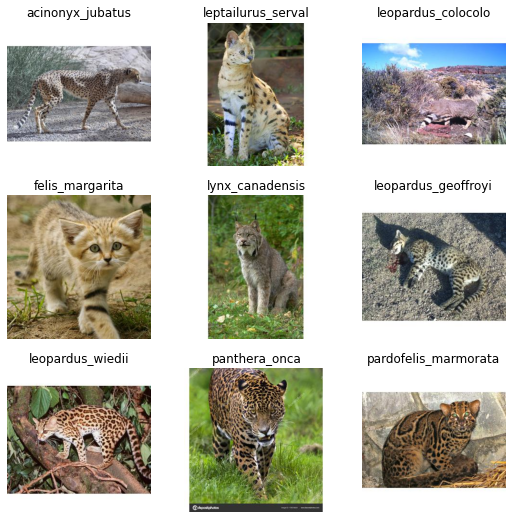

In [6]:
dls = ImageDataLoaders.from_folder(cats, valid_pct=0.2, seed=42)
dls.show_batch(nrows=3, ncols=3)

In [7]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(5)

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,3.599299,1.421242,0.408192,00:27


epoch,train_loss,valid_loss,error_rate,time
0,1.432933,0.992463,0.259887,00:27
1,0.904157,0.847741,0.240113,00:26
2,0.553699,0.806763,0.237288,00:27
3,0.317081,0.708848,0.199153,00:26
4,0.187523,0.703831,0.192090,00:26


## Interpretation of the model

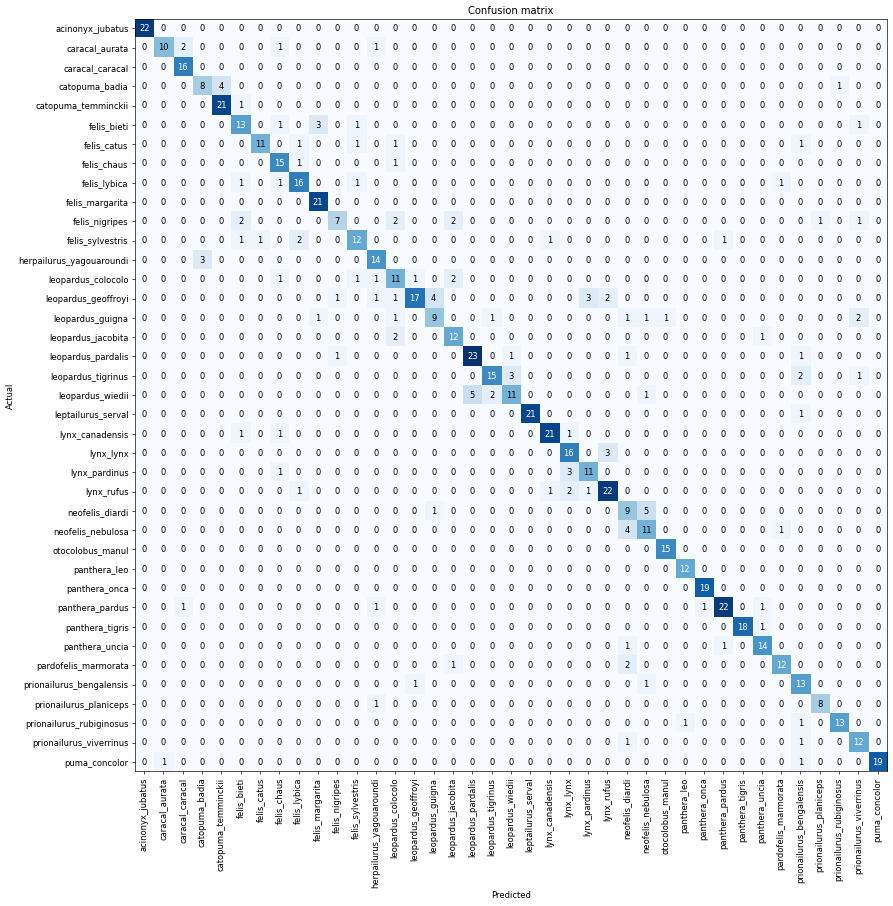

In [8]:
confus = ClassificationInterpretation.from_learner(learn)
confus.plot_confusion_matrix(figsize=(15,15), dpi=60)

In [9]:
confus.most_confused(min_val=5)

[('leopardus_wiedii', 'leopardus_pardalis', 5),
 ('neofelis_diardi', 'neofelis_nebulosa', 5)]

It is understandable that the model confuses `neofelis_diardi` with `neofelis_nebulosa` as they are respectively the "Sunda clouded leopard" (see https://en.wikipedia.org/wiki/Sunda_clouded_leopard) and the "Clouded leopard" (see https://en.wikipedia.org/wiki/Clouded_leopard). 

It's a similar issue with the Margay and the Ocelot: 
- `leopardus_wiedii`: https://en.wikipedia.org/wiki/Margay
- `leopardus_pardalis`: https://en.wikipedia.org/wiki/Ocelot

## Fine tuning

SuggestedLRs(valley=0.0012022644514217973)

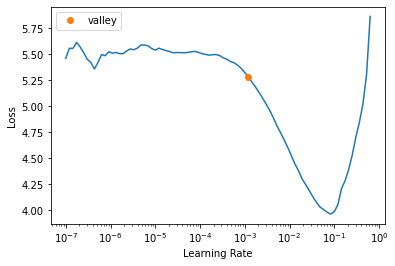

In [10]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.lr_find()

In [11]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(5, base_lr=1e-3)

epoch,train_loss,valid_loss,error_rate,time
0,4.218246,1.921829,0.526836,00:22


epoch,train_loss,valid_loss,error_rate,time
0,2.145483,1.364596,0.375706,00:27
1,1.437450,0.984486,0.271186,00:27
2,0.903355,0.839989,0.237288,00:27
3,0.563778,0.808162,0.227401,00:27
4,0.387647,0.801791,0.225989,00:26


In [12]:
# Let's unfreeze the model (i.e. train all the layers)
learn.unfreeze()

SuggestedLRs(valley=9.999999747378752e-06)

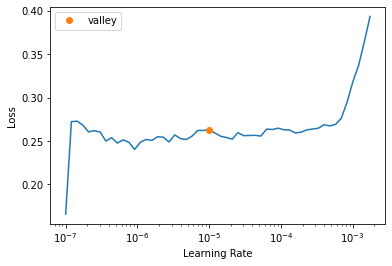

In [13]:
learn.lr_find()

In [14]:
learn.fit_one_cycle(7, lr_max=5e-5)

epoch,train_loss,valid_loss,error_rate,time
0,0.267154,0.806404,0.218927,00:27
1,0.264246,0.814297,0.214689,00:26
2,0.246432,0.760454,0.200565,00:27
3,0.181526,0.762753,0.192090,00:26
4,0.138427,0.740956,0.192090,00:26
5,0.104659,0.749559,0.189266,00:27
6,0.086169,0.746349,0.189266,00:27


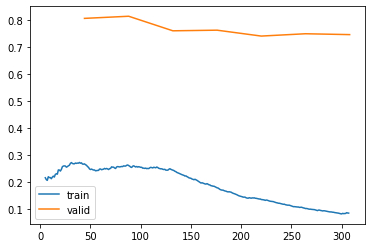

In [15]:
learn.recorder.plot_loss()

## Identifying species on new pictures

There are four pictures of feline animals I would like to identify. Three were taken at a zoo by me and consist of:
- a tiger: *panthera tigris*
- a jaguar: *panthera onca*
- a snow leopard: *panthera uncia*

The last picture is a picture of my cat, Muffin. Domestic cats are *felis catus*.

My 4 pictures are located in a separate folder from the data I used for training.

In [16]:
path2 = Path('Cats/Test_Pictures')
img1 = Image.open(path2/'test1.jpg').resize((299,299))
img2 = Image.open(path2/'test2.jpg').resize((299,299))
img3 = Image.open(path2/'test3.jpg').resize((299,299))
img4 = Image.open(path2/'test4.jpg').resize((299,299))

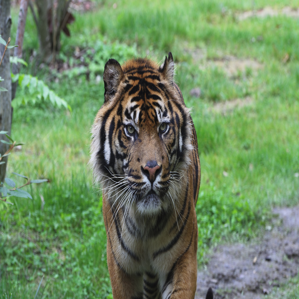

In [17]:
img2.show()

OK, that's a tiger... Let's see if the model can predict it correctly! Let's load our learner and predict the class this picture belongs to. 

In [18]:
pred_class,pred_idx,outputs = learn.predict(tensor(img2))

In [19]:
pred_class

'panthera_tigris'

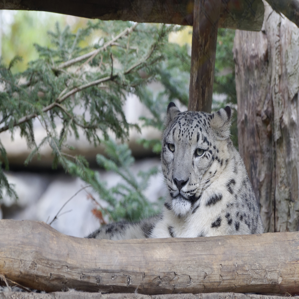

In [20]:
img3

In [21]:
pred_class, pred_idx, outputs = learn.predict(tensor(img3))
pred_class

'panthera_uncia'

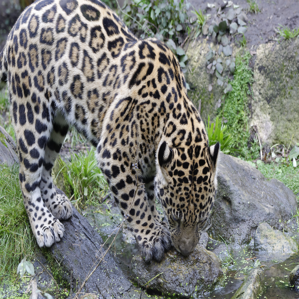

In [22]:
img1

In [23]:
pred_class, pred_idx, outputs = learn.predict(tensor(img1))
pred_class

'panthera_onca'

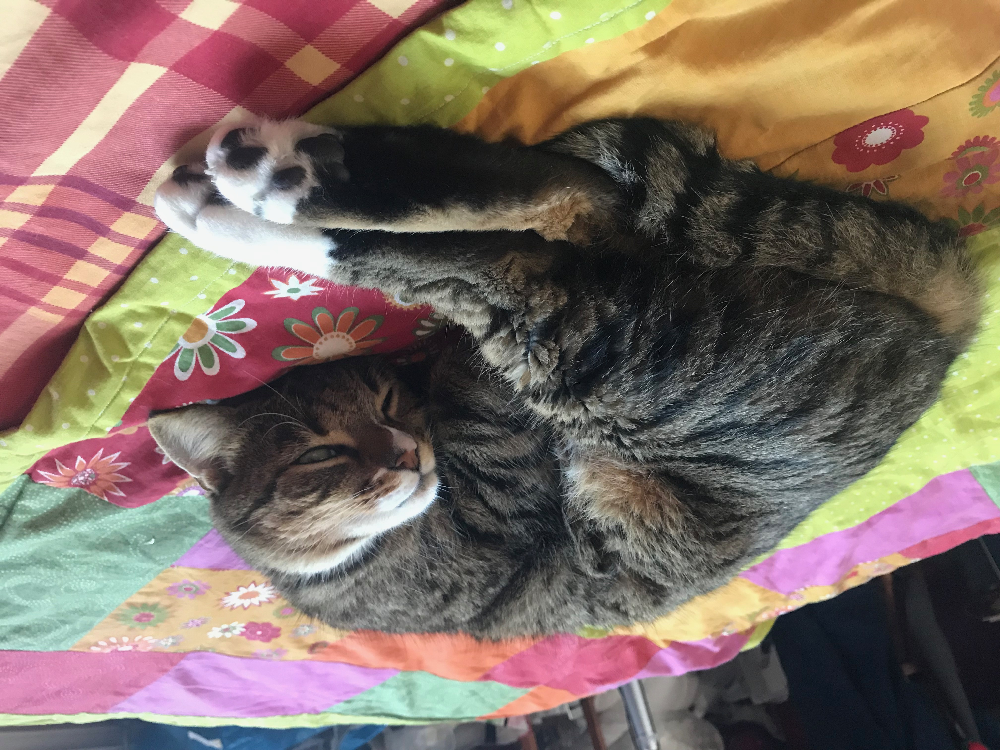

In [24]:
img5 = Image.open(path2/'test5.JPEG')
img5

In [25]:
pred_class, pred_idx, outputs = learn.predict(tensor(img5))
pred_class

'leopardus_jacobita'

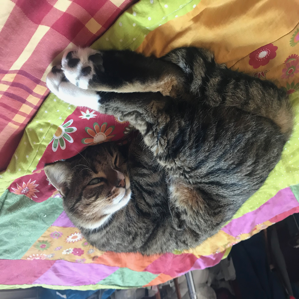

In [26]:
img6 = Image.open(path2/'test5.JPEG').resize((299,299))
img6

In [27]:
pred_class, pred_idx, outputs = learn.predict(tensor(img6))
pred_class

'felis_catus'

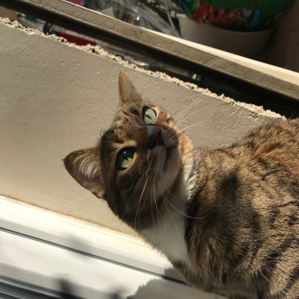

In [28]:
img4

In [29]:
pred_class, pred_idx, outputs = learn.predict(tensor(img4))
pred_class

'felis_catus'